# Predicting Sleep Disorders Using Machine Learning Algorithms

In [127]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
import plotly.graph_objects as go
import xgboost as xgb 

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv("C:/Users/ARCHANA/Desktop/VCET/Mini project/sleep_disorder.csv")

In [4]:
df.head()

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
0,1,Male,27,Software Engineer,6.1,6,42,6,Overweight,126/83,77,4200,NaN
1,2,Male,28,Doctor,6.2,6,60,8,Normal,125/80,75,10000,NaN
2,3,Male,28,Doctor,6.2,6,60,8,Normal,125/80,75,10000,NaN
3,4,Male,28,Sales Representative,5.9,4,30,8,Obese,140/90,85,3000,Sleep Apnea
4,5,Male,28,Sales Representative,5.9,4,30,8,Obese,140/90,85,3000,Sleep Apnea


In [5]:
df.tail()

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
369,370,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
370,371,Female,59,Nurse,8.0,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
371,372,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
372,373,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
373,374,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374 entries, 0 to 373
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Person ID                374 non-null    int64  
 1   Gender                   374 non-null    object 
 2   Age                      374 non-null    int64  
 3   Occupation               374 non-null    object 
 4   Sleep Duration           374 non-null    float64
 5   Quality of Sleep         374 non-null    int64  
 6   Physical Activity Level  374 non-null    int64  
 7   Stress Level             374 non-null    int64  
 8   BMI Category             374 non-null    object 
 9   Blood Pressure           374 non-null    object 
 10  Heart Rate               374 non-null    int64  
 11  Daily Steps              374 non-null    int64  
 12  Sleep Disorder           155 non-null    object 
dtypes: float64(1), int64(7), object(5)
memory usage: 38.1+ KB


In [7]:
df.describe()

,Person ID,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,Heart Rate,Daily Steps
count,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000
mean,187.500000,42.184492,7.132086,7.312834,59.171123,5.385027,70.165775,6816.844920
std,108.108742,8.673133,0.795657,1.196956,20.830804,1.774526,4.135676,1617.915679
min,1.000000,27.000000,5.800000,4.000000,30.000000,3.000000,65.000000,3000.000000
25%,94.250000,35.250000,6.400000,6.000000,45.000000,4.000000,68.000000,5600.000000
50%,187.500000,43.000000,7.200000,7.000000,60.000000,5.000000,70.000000,7000.000000
75%,280.750000,50.000000,7.800000,8.000000,75.000000,7.000000,72.000000,8000.000000
max,374.000000,59.000000,8.500000,9.000000,90.000000,8.000000,86.000000,10000.000000


In [8]:
df.shape

(374, 13)

In [9]:
df.duplicated().sum()

0

In [10]:
df.isnull().sum()

Person ID                    0
Gender                       0
Age                          0
Occupation                   0
Sleep Duration               0
Quality of Sleep             0
Physical Activity Level      0
Stress Level                 0
BMI Category                 0
Blood Pressure               0
Heart Rate                   0
Daily Steps                  0
Sleep Disorder             219
dtype: int64

In [11]:
df.nunique()

Person ID                  374
Gender                       2
Age                         31
Occupation                  11
Sleep Duration              27
Quality of Sleep             6
Physical Activity Level     16
Stress Level                 6
BMI Category                 4
Blood Pressure              25
Heart Rate                  19
Daily Steps                 20
Sleep Disorder               2
dtype: int64

# check numerical data types

In [12]:
# Check numerical data types
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

print("Numerical Columns:")
for column in numerical_columns:
    unique_values = df[column].unique()
    print(f"{column}: {unique_values}")

# Check object data types
object_columns = df.select_dtypes(include=['object']).columns

print("\nObject Columns:")
for column in object_columns:
    unique_values = df[column].unique()
    print(f"{column}: {unique_values}")

Numerical Columns:
Person ID: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 

In [13]:
 df['Gender'].value_counts()

Gender
Male      189
Female    185
Name: count, dtype: int64

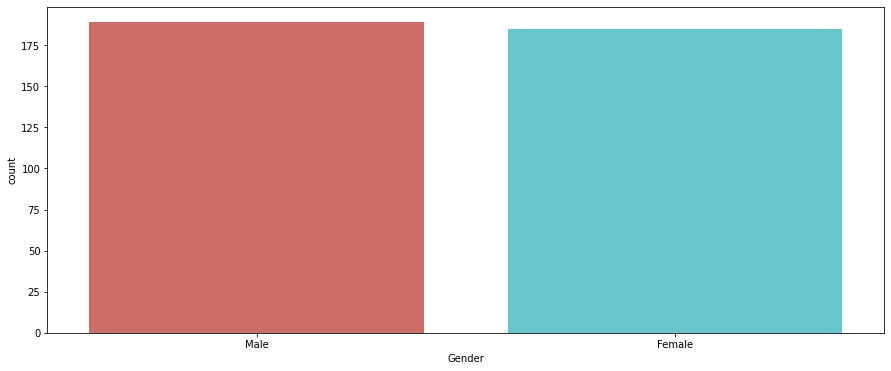

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 6))
sns.countplot(x='Gender', data=df, palette='hls')
plt.xticks(rotation=0)
plt.show()


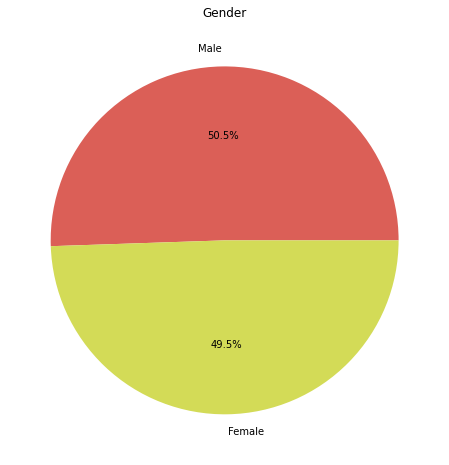

In [15]:
plt.figure(figsize=(20, 8))
counts = df['Gender'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('Gender')
plt.show()

In [19]:
fig = go.Figure(data=[go.Bar(x=df['Gender'].value_counts().index, y=df['Gender'].value_counts())])
fig.update_layout(
        title= 'Gender',
        xaxis_title="Gender",
        yaxis_title="Count"
    )
fig.show()

In [21]:
counts = df['Gender'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Gender')
fig.show()

In [22]:
df['Occupation'].value_counts()

Occupation
Nurse                   73
Doctor                  71
Engineer                63
Lawyer                  47
Teacher                 40
Accountant              37
Salesperson             32
Software Engineer        4
Scientist                4
Sales Representative     2
Manager                  1
Name: count, dtype: int64

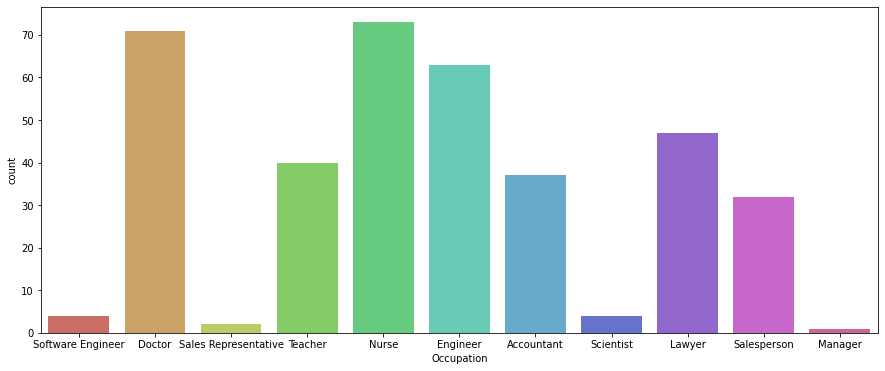

In [27]:
plt.figure(figsize=(15,6))
sns.countplot(x='Occupation', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

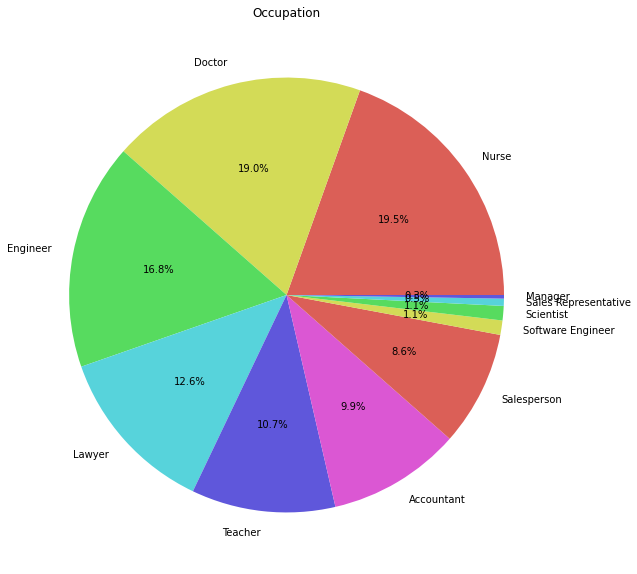

In [28]:
plt.figure(figsize=(20, 10))
counts = df['Occupation'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('Occupation')
plt.show()

In [29]:
fig = go.Figure(data=[go.Bar(x=df['Occupation'].value_counts().index, y=df['Occupation'].value_counts())])
fig.update_layout(
        title= 'Occupation',
        xaxis_title="Occupation",
        yaxis_title="Count"
    )
fig.show()

In [30]:
counts = df['Occupation'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Occupation')
fig.show()

In [31]:
df['BMI Category'].value_counts()

BMI Category
Normal           195
Overweight       148
Normal Weight     21
Obese             10
Name: count, dtype: int64

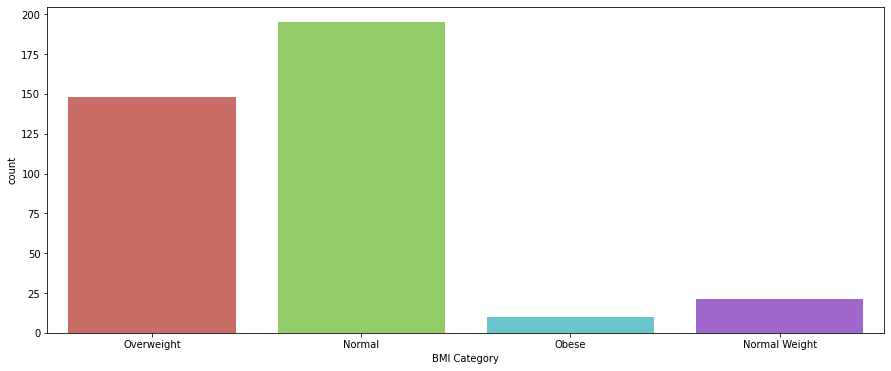

In [35]:
plt.figure(figsize=(15,6))
sns.countplot(x='BMI Category', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

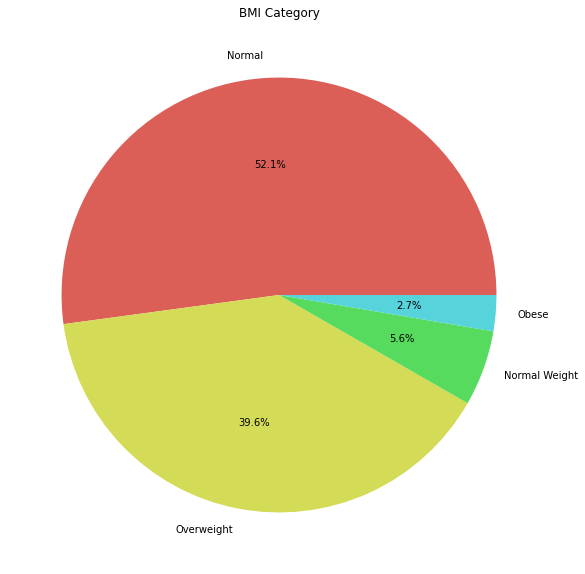

In [36]:
plt.figure(figsize=(20, 10))
counts = df['BMI Category'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('BMI Category')
plt.show()

In [37]:
fig = go.Figure(data=[go.Bar(x=df['BMI Category'].value_counts().index, y=df['BMI Category'].value_counts())])
fig.update_layout(
        title= 'BMI Category',
        xaxis_title="BMI Category",
        yaxis_title="Count"
    )
fig.show()

In [38]:
df['Sleep Disorder'].value_counts()

Sleep Disorder
Sleep Apnea    78
Insomnia       77
Name: count, dtype: int64

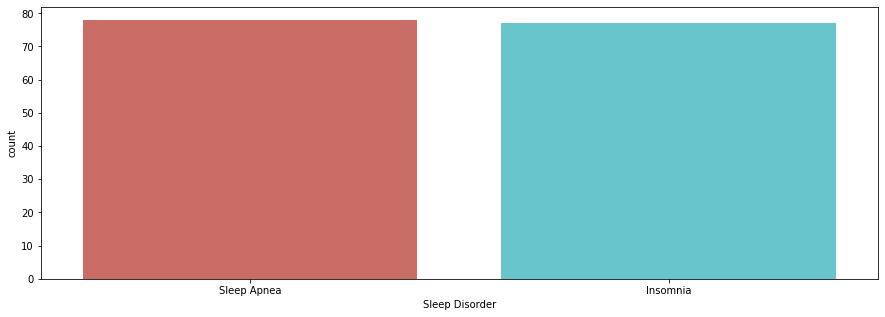

In [43]:
plt.figure(figsize=(15,5))
sns.countplot(x='Sleep Disorder', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

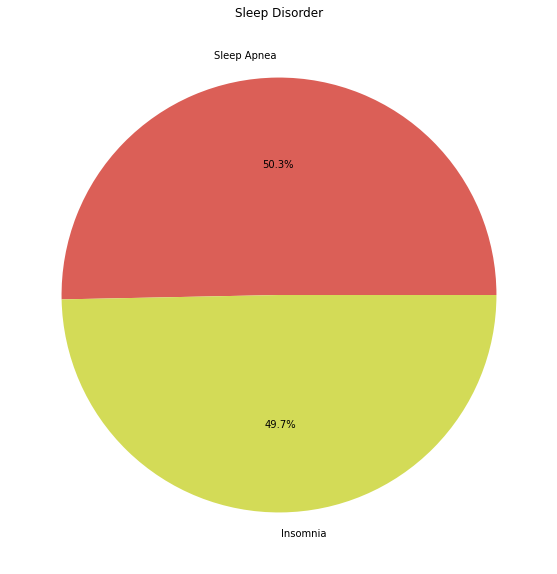

In [44]:
plt.figure(figsize=(20, 10))
counts = df['Sleep Disorder'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('Sleep Disorder')
plt.show()

In [45]:
fig = go.Figure(data=[go.Bar(x=df['Sleep Disorder'].value_counts().index, y=df['Sleep Disorder'].value_counts())])
fig.update_layout(
        title= 'Sleep Disorder',
        xaxis_title="Sleep Disorder",
        yaxis_title="Count"
    )
fig.show()

In [46]:
counts = df['Sleep Disorder'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Sleep Disorder')
fig.show()

In [47]:
# Split the blood pressure values into systolic and diastolic columns
df[['Systolic', 'Diastolic']] = df['Blood Pressure'].str.split('/', expand=True).astype(int)

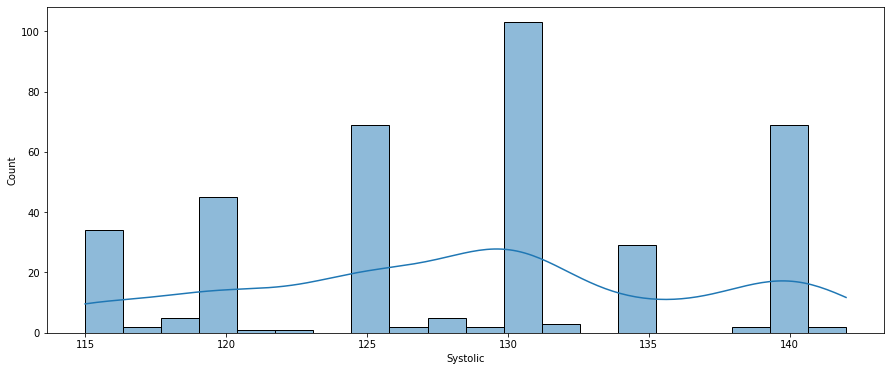

In [48]:
plt.figure(figsize=(15,6))
sns.histplot(df['Systolic'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

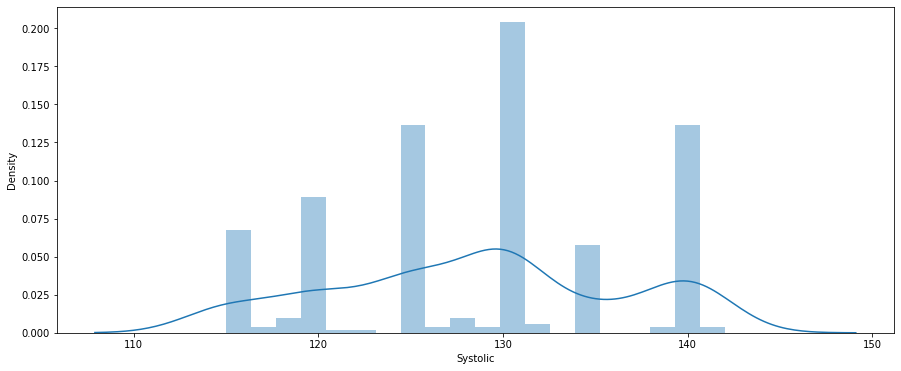

In [49]:
plt.figure(figsize=(15,6))
sns.distplot(df['Systolic'], kde = True, bins = 20)
plt.xticks(rotation = 0)
plt.show()

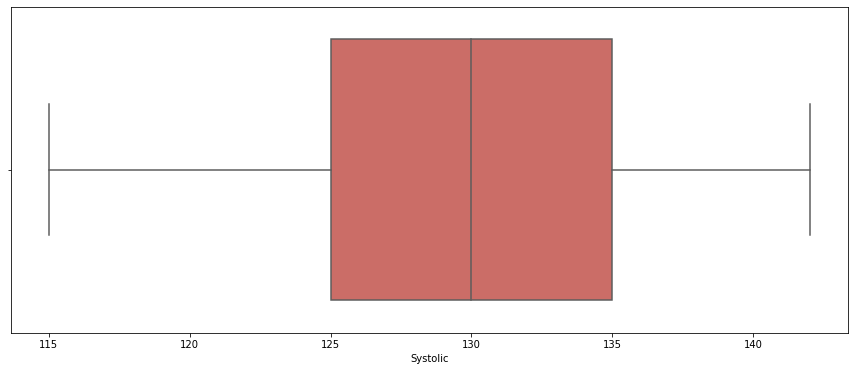

In [51]:
plt.figure(figsize=(15,6))
sns.boxplot(x='Systolic', data=df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

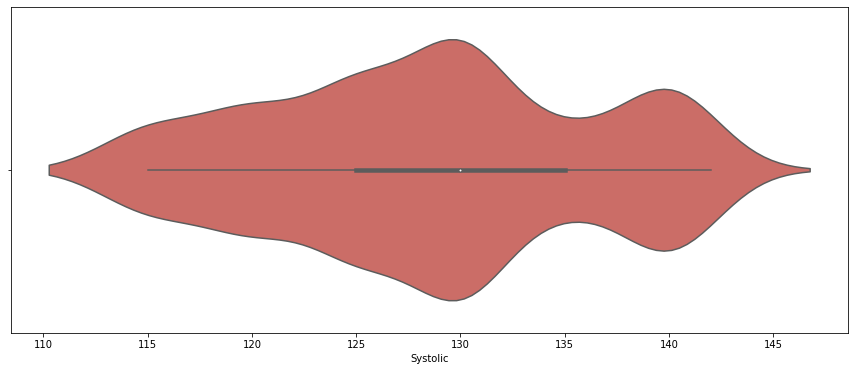

In [53]:
plt.figure(figsize=(15,6))
sns.violinplot(x='Systolic', data=df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

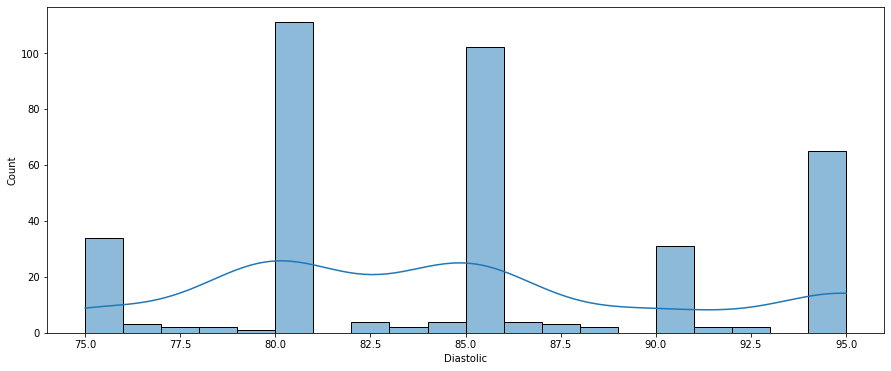

In [56]:
plt.figure(figsize=(15,6))
sns.histplot(df['Diastolic'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

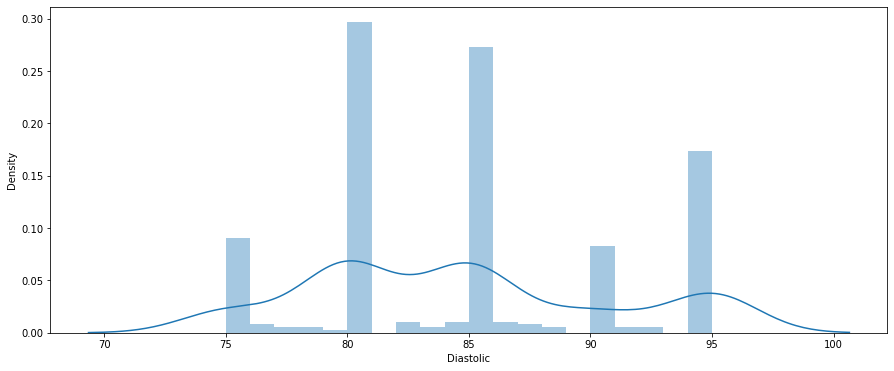

In [57]:
plt.figure(figsize=(15,6))
sns.distplot(df['Diastolic'], kde = True, bins = 20)
plt.xticks(rotation = 0)
plt.show()

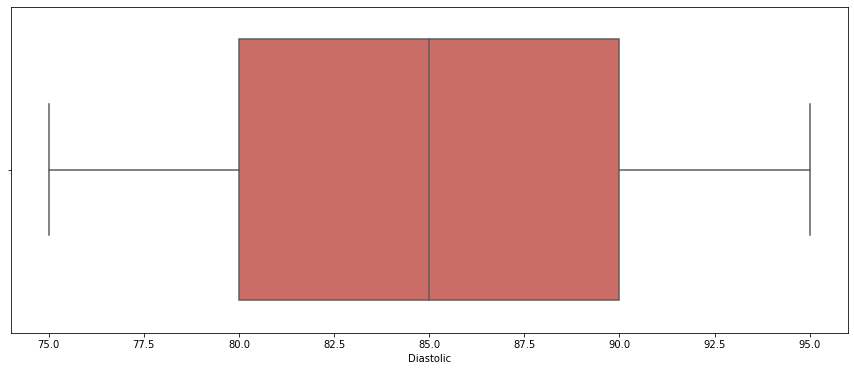

In [59]:
plt.figure(figsize=(15,6))
sns.boxplot(x='Diastolic', data=df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

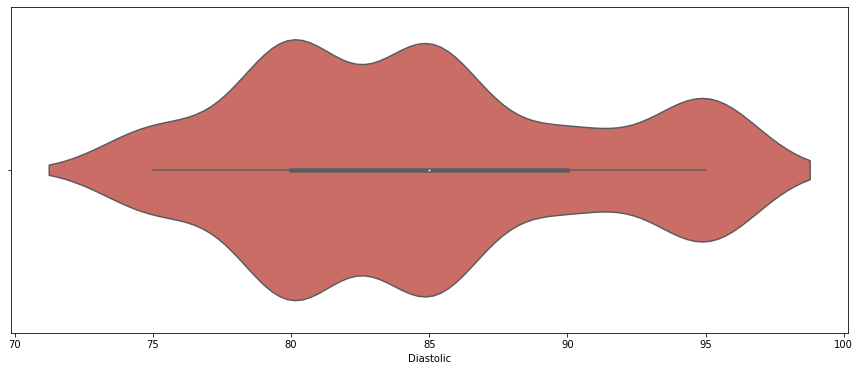

In [61]:
plt.figure(figsize=(15,6))
sns.violinplot(x='Diastolic', data=df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

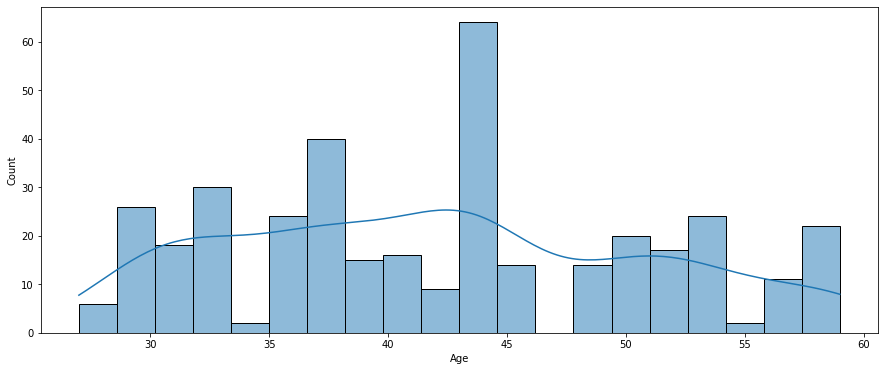

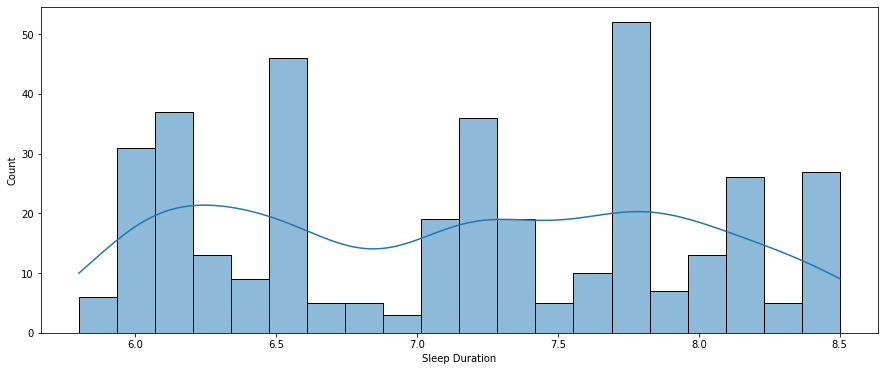

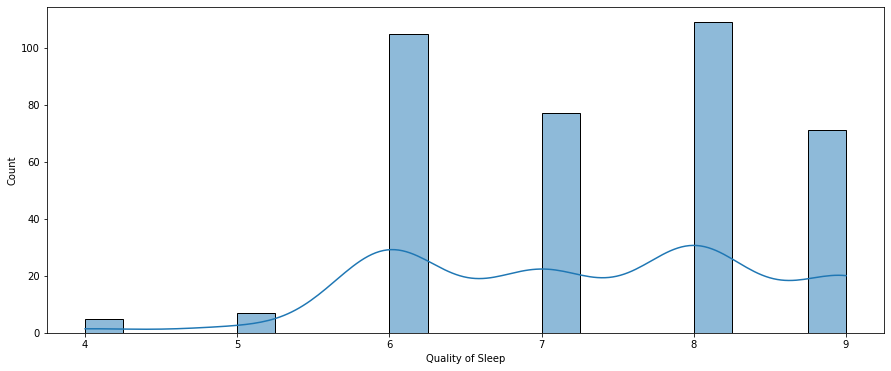

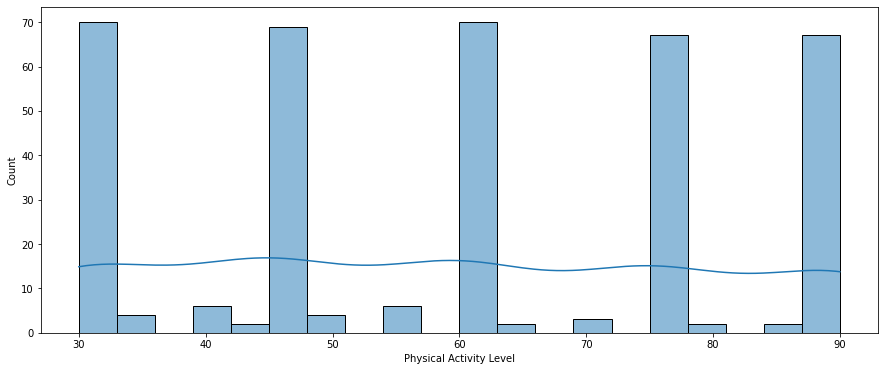

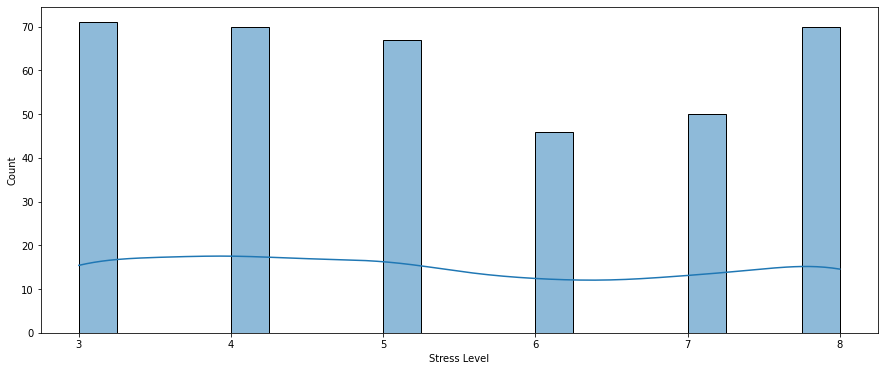

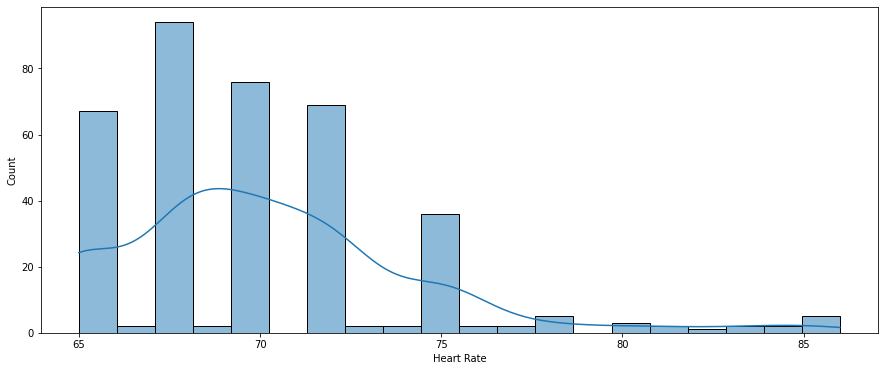

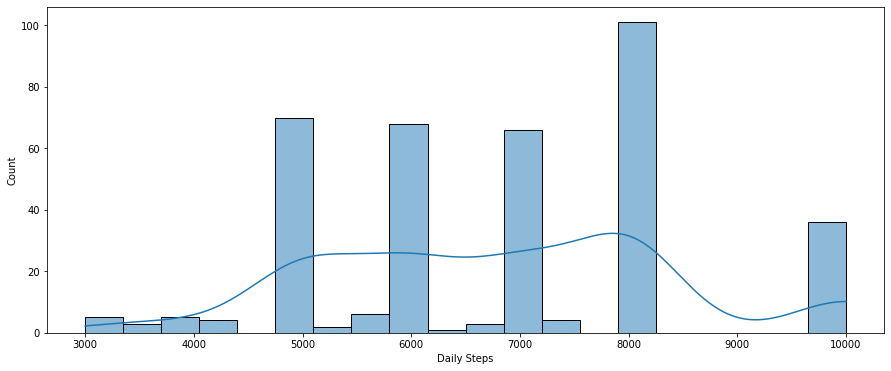

In [62]:
for i in numerical_columns:
    if i != 'Person ID':
        plt.figure(figsize=(15,6))
        sns.histplot(df[i], kde = True, bins = 20, palette = 'hls')
        plt.xticks(rotation = 0)
        plt.show()

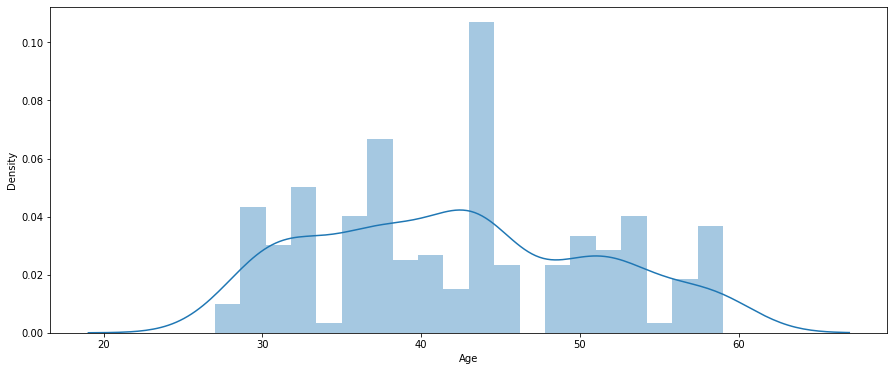

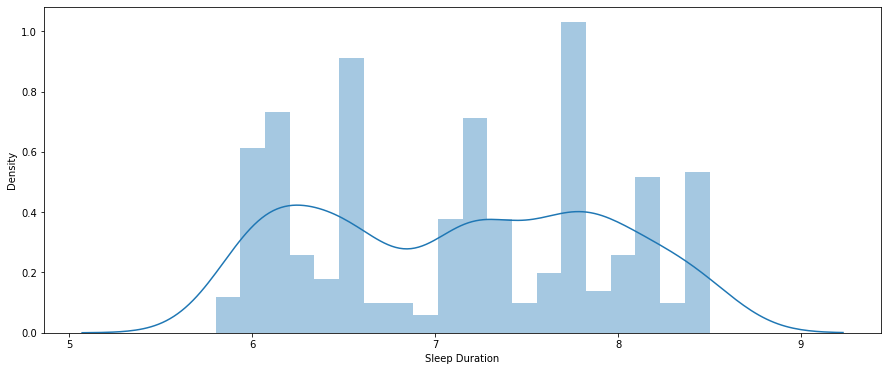

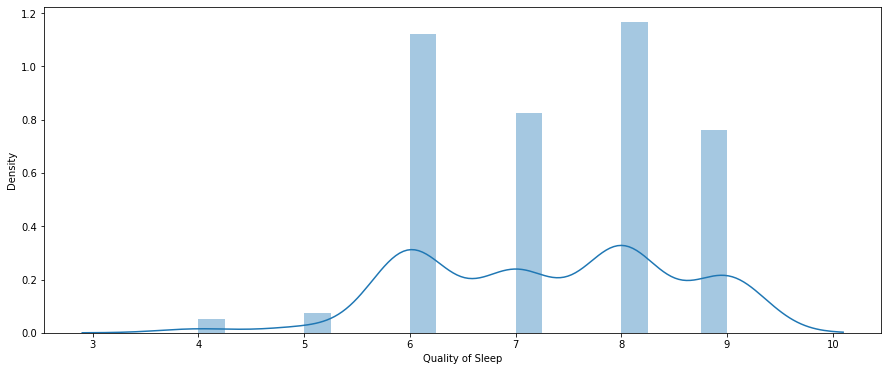

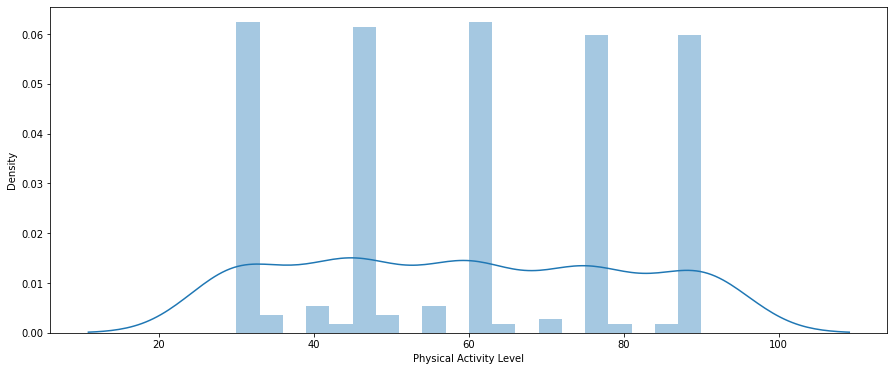

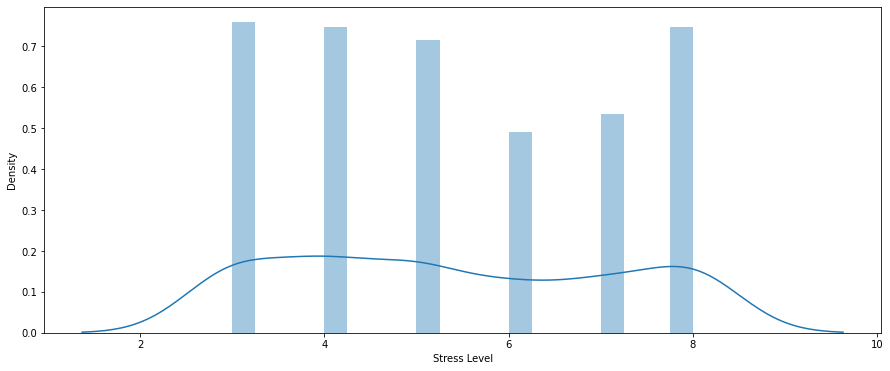

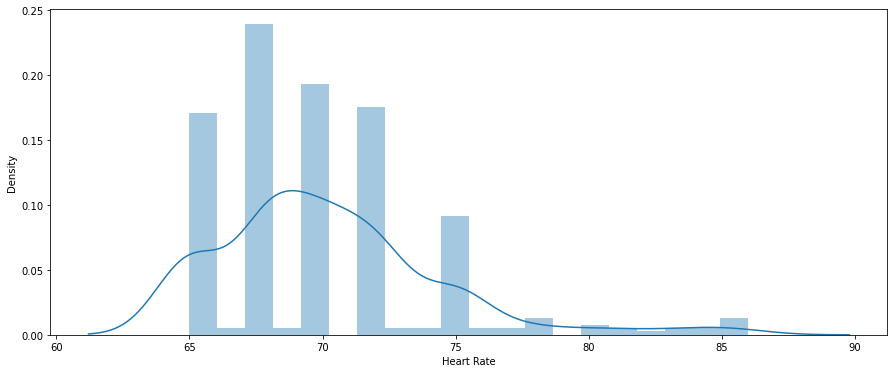

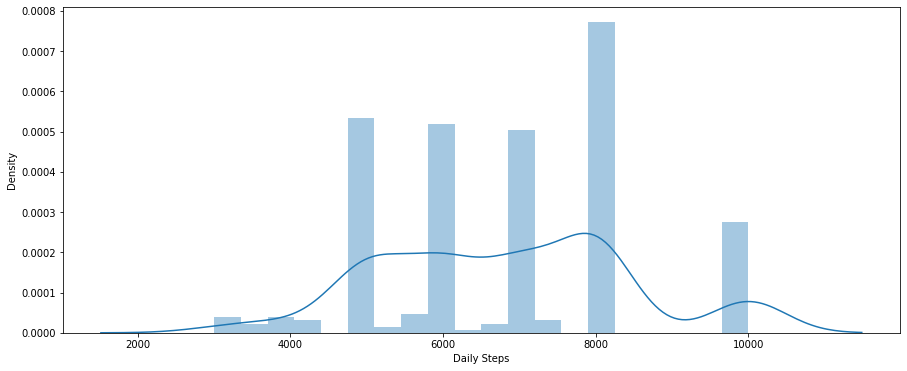

In [63]:
for i in numerical_columns:
    if i != 'Person ID':
        plt.figure(figsize=(15,6))
        sns.distplot(df[i], kde = True, bins = 20)
        plt.xticks(rotation = 0)
        plt.show()

In [69]:
for i in numerical_columns:
    if i != 'Person ID':
        plt.figure(figsize=(15,6))
        sns.boxplot(df[i], data = df, palette = 'hls')
        plt.xticks(rotation = 0)
        plt.show()

TypeError: boxplot() got multiple values for argument 'data'

<Figure size 1080x432 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for i in numerical_columns:
    if i != 'Person ID':
        plt.figure(figsize=(15, 6))
        sns.violinplot(x=i, data=df, palette='hls')
        plt.xticks(rotation=0)
        plt.show()


In [71]:
for column in numerical_columns:
    if column != 'Person ID':
        fig = px.histogram(df, x=column, nbins=20, histnorm='probability density')
        fig.update_layout(title=f"Histogram of {column}", xaxis_title=column, yaxis_title="Probability Density")
        fig.show()

In [72]:
for column in numerical_columns:
    if column != 'Person ID':
        fig = px.box(df, y=column)
        fig.update_layout(title=f"Box Plot of {column}", yaxis_title=column)
        fig.show()

In [73]:
for column in numerical_columns:
    if column != 'Person ID':
        fig = px.violin(df, y=column)
        fig.update_layout(title=f"Box Plot of {column}", yaxis_title=column)
        fig.show()

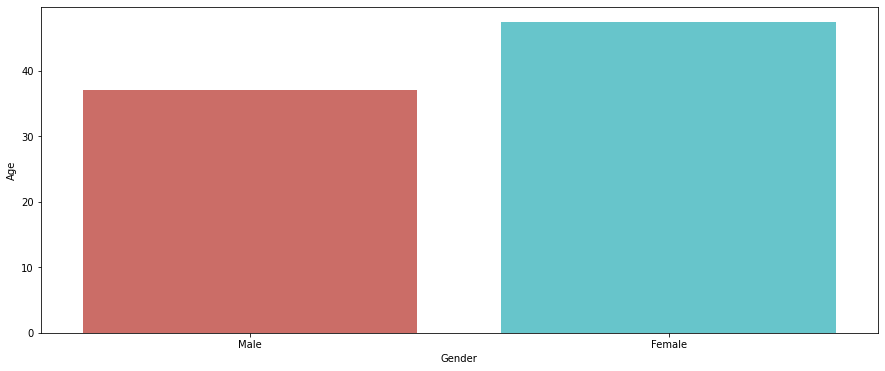

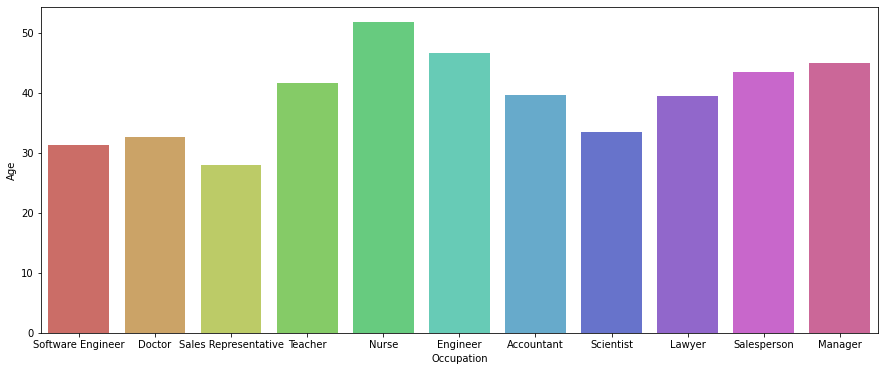

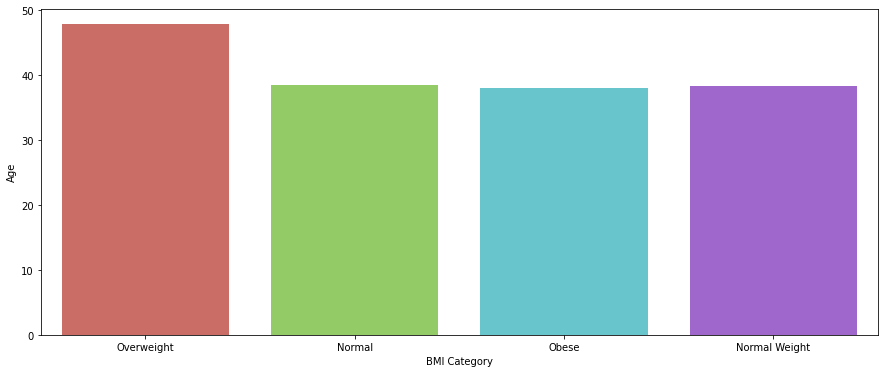

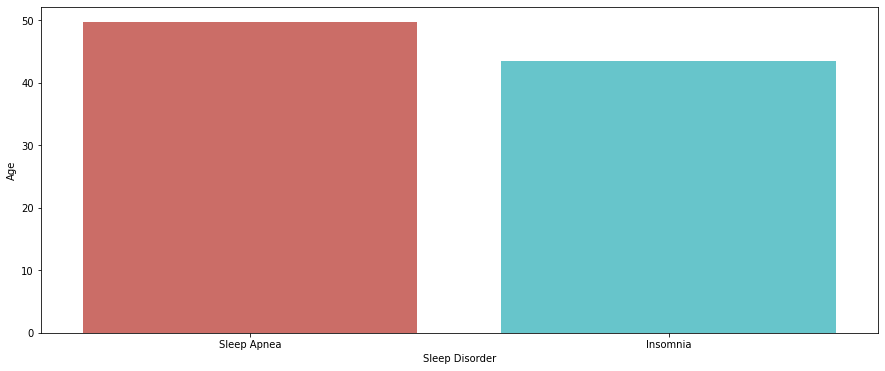

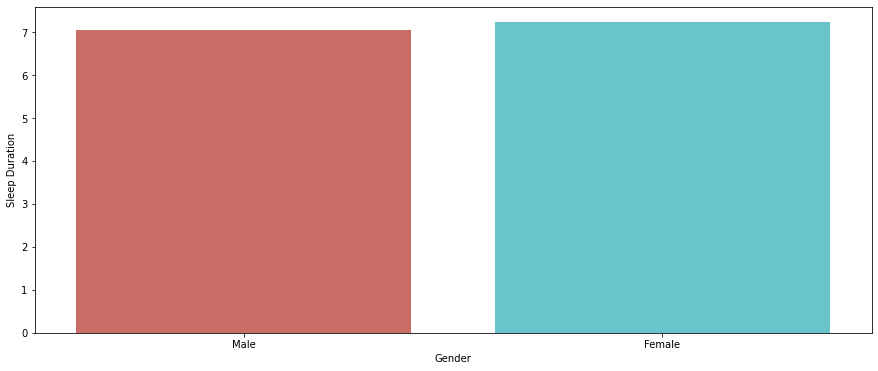

...

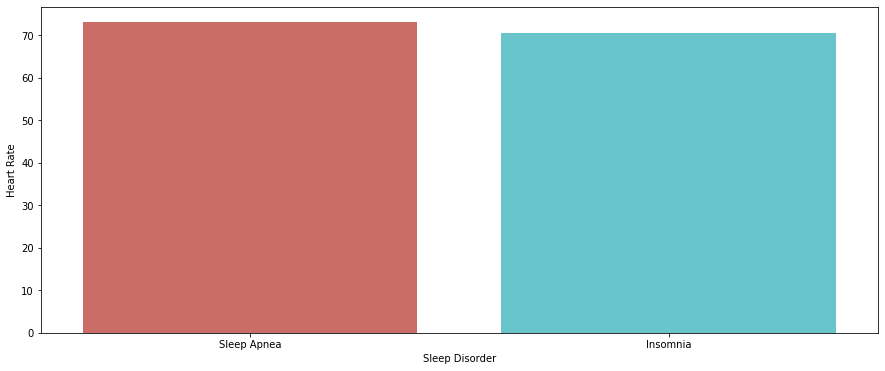

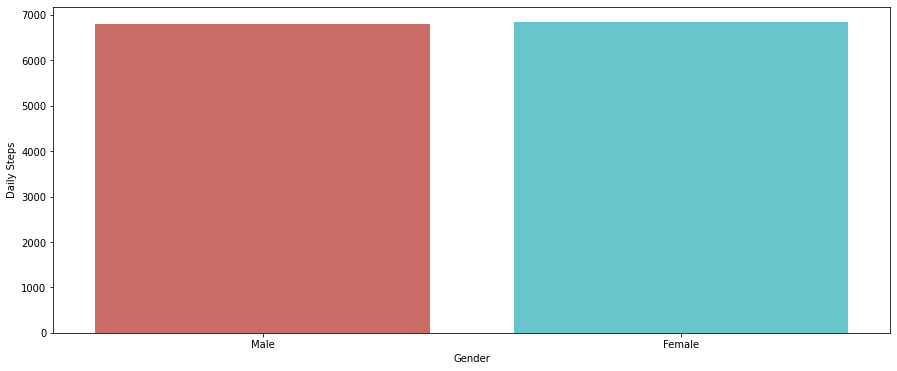

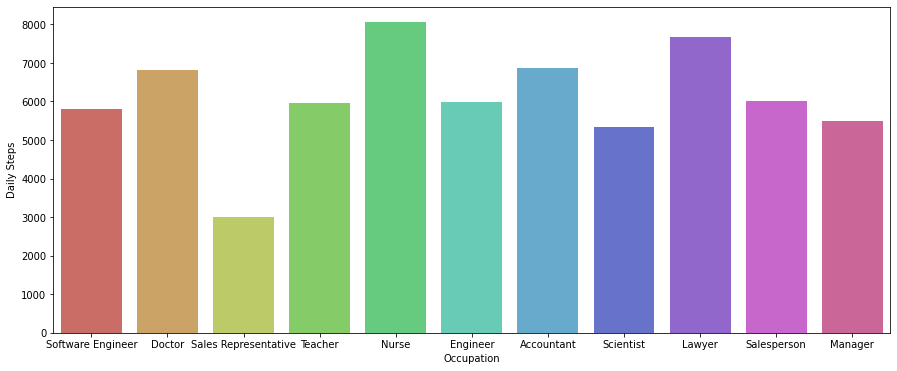

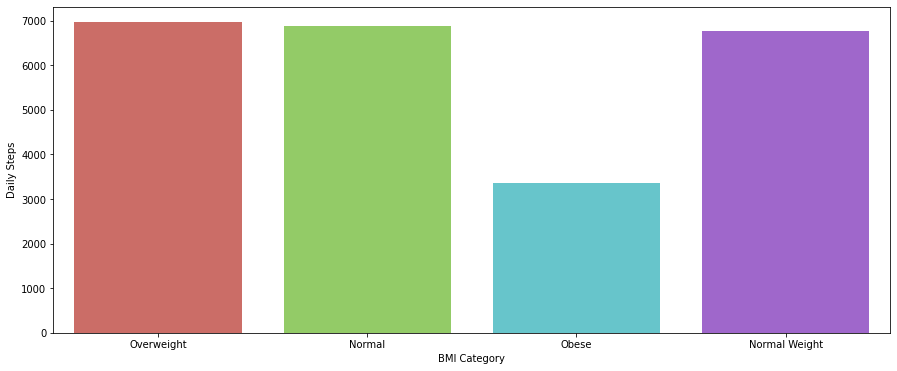

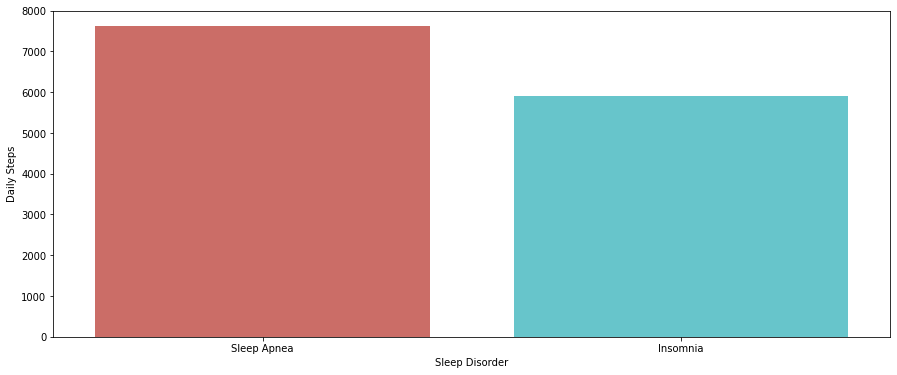

In [74]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID':
            if j != 'Blood Pressure':
                plt.figure(figsize=(15,6))
                sns.barplot(x = df[j], y = df[i], data = df, ci = None, palette = 'hls')
                plt.show()

In [75]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID' and j != 'Blood Pressure':
            fig = px.bar(df, x=j, y=i)
            fig.show()

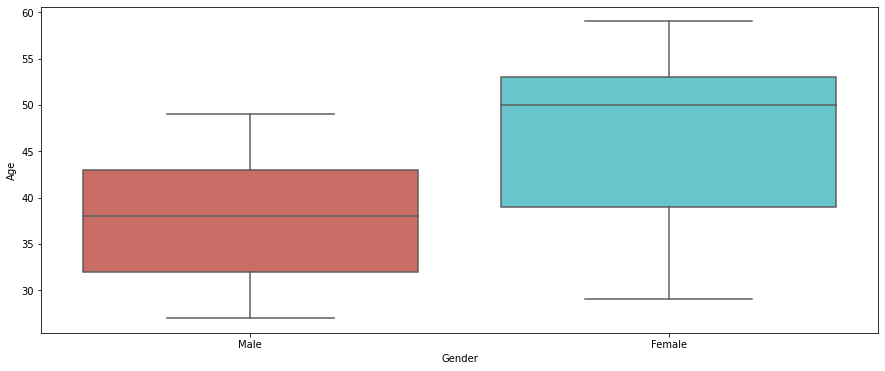

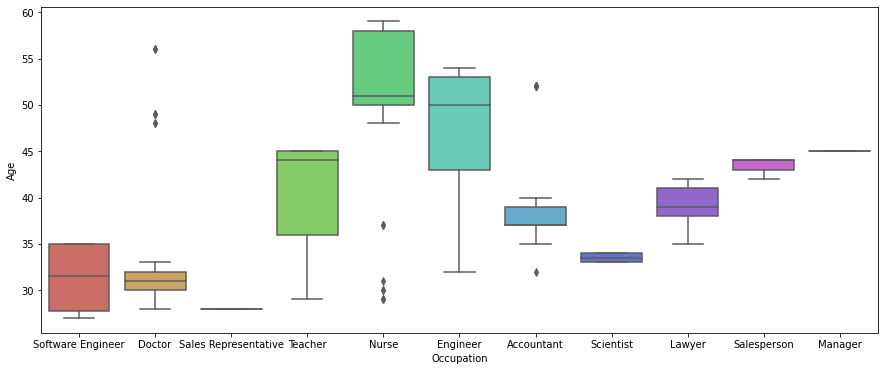

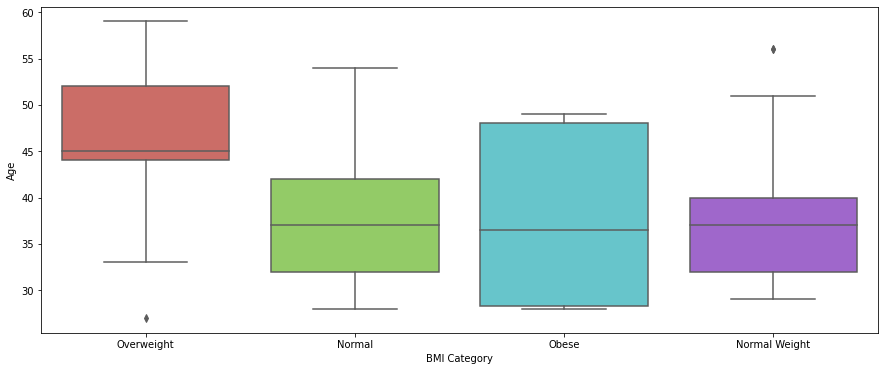

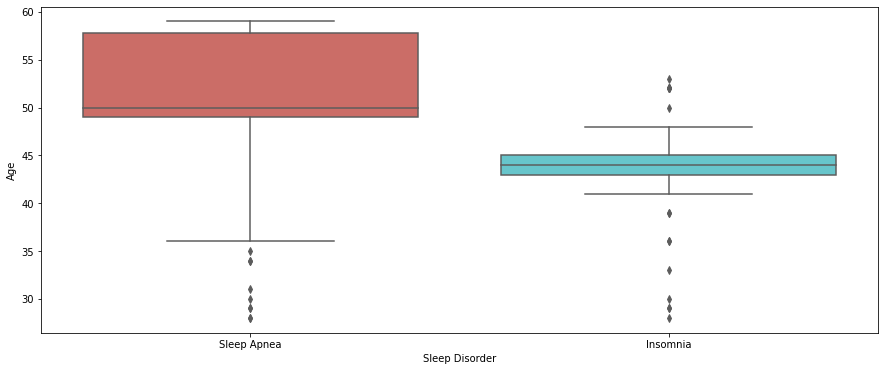

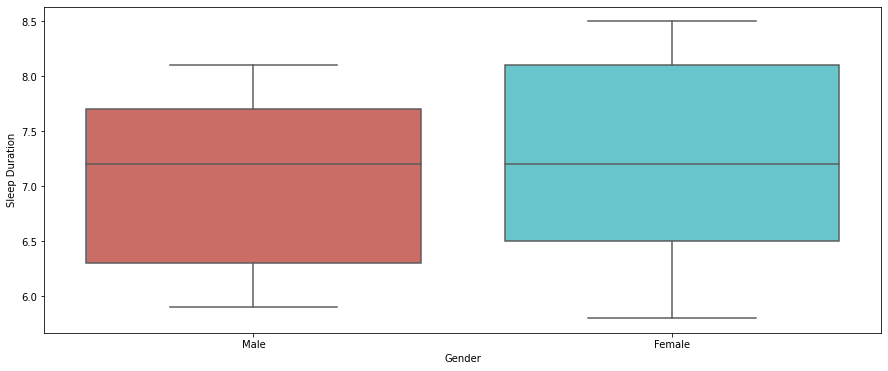

...

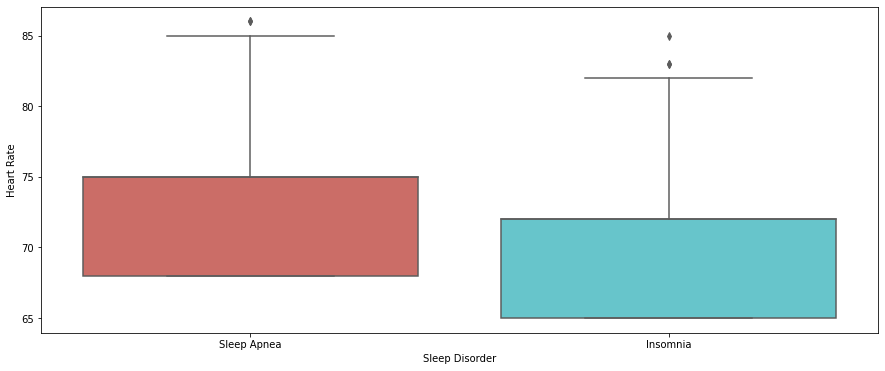

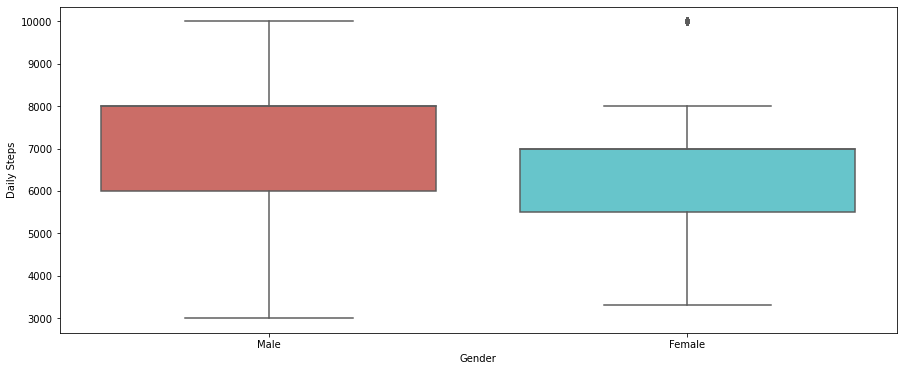

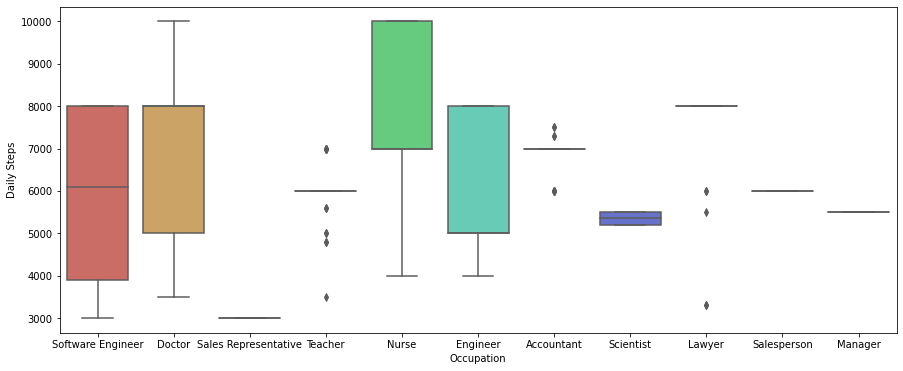

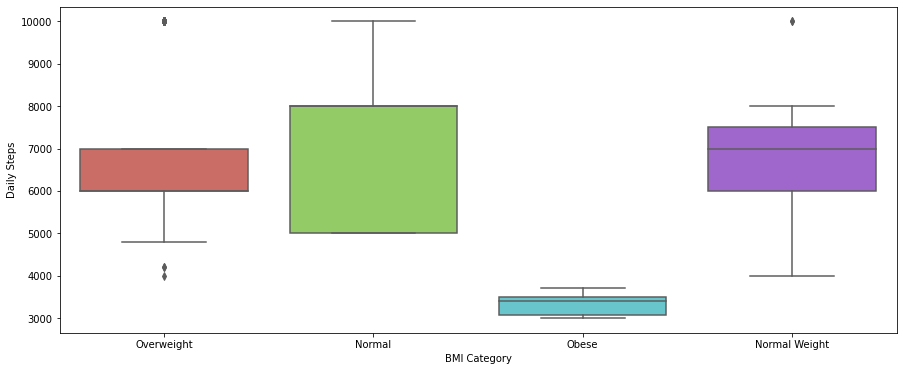

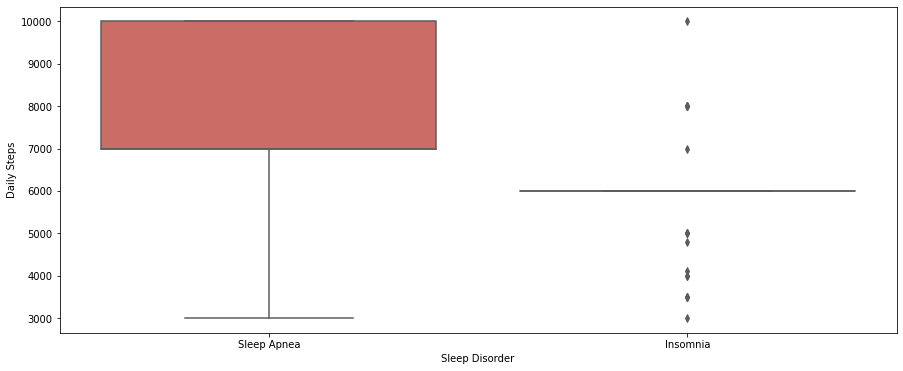

In [76]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID':
            if j != 'Blood Pressure':
                plt.figure(figsize=(15,6))
                sns.boxplot(x = df[j], y = df[i], data = df, palette = 'hls')
                plt.show()

In [77]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID' and j != 'Blood Pressure':
            fig = px.box(df, x=j, y=i)
            fig.show()

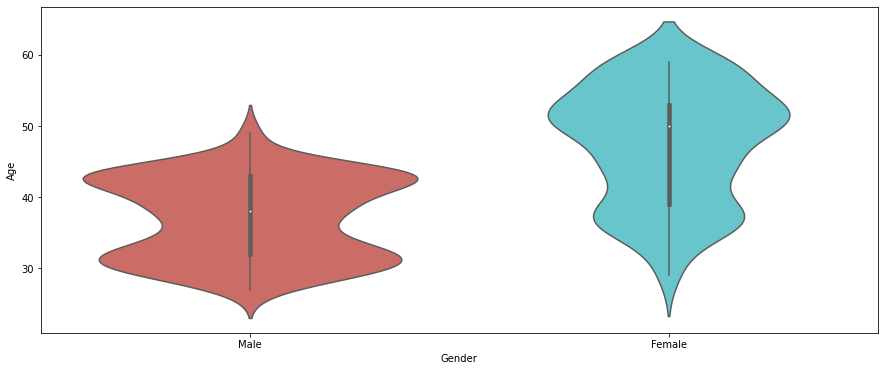

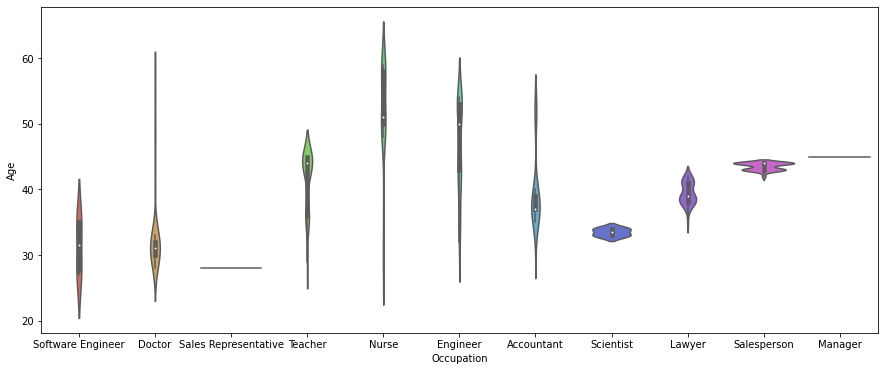

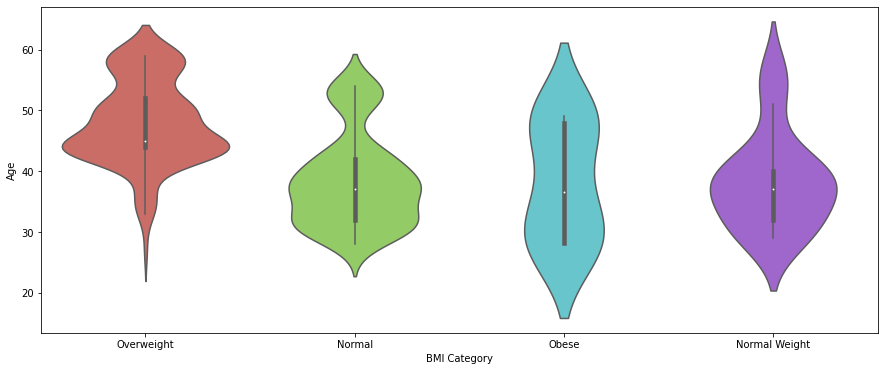

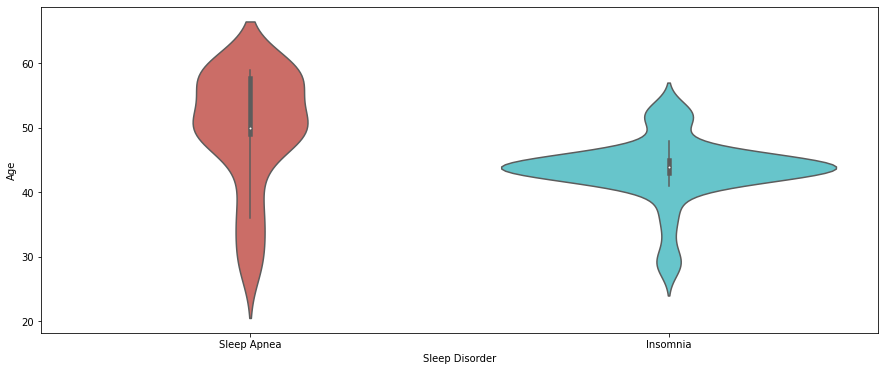

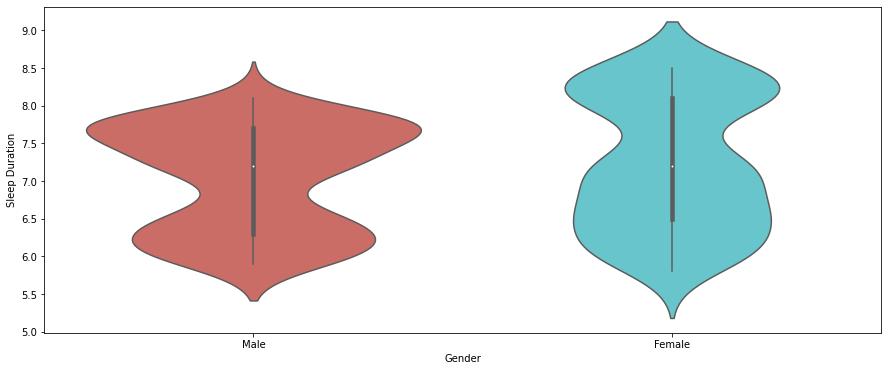

...

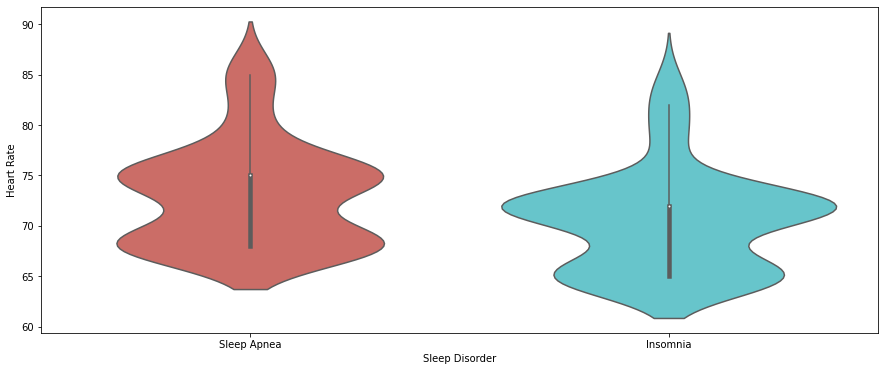

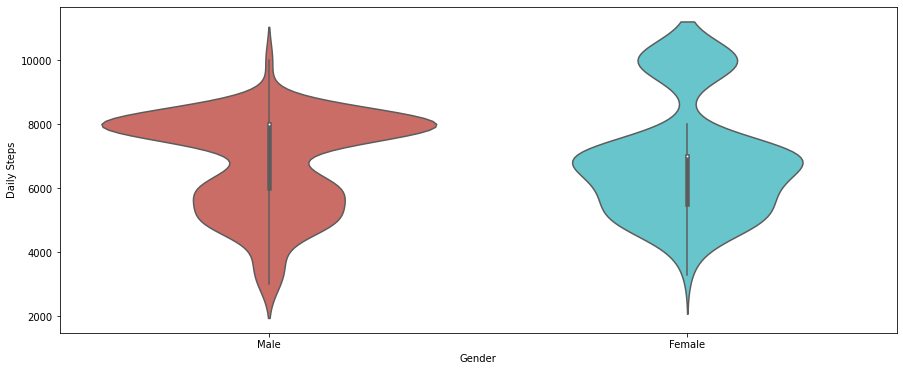

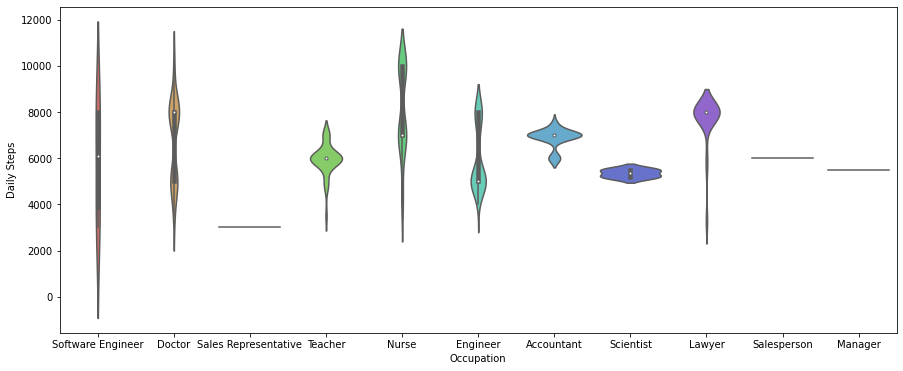

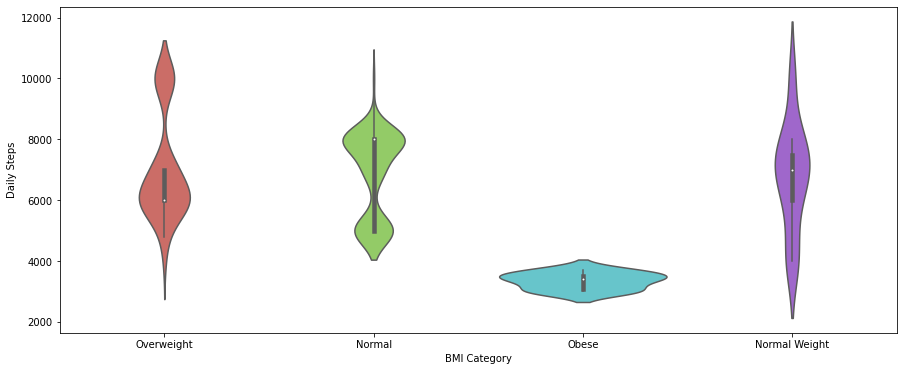

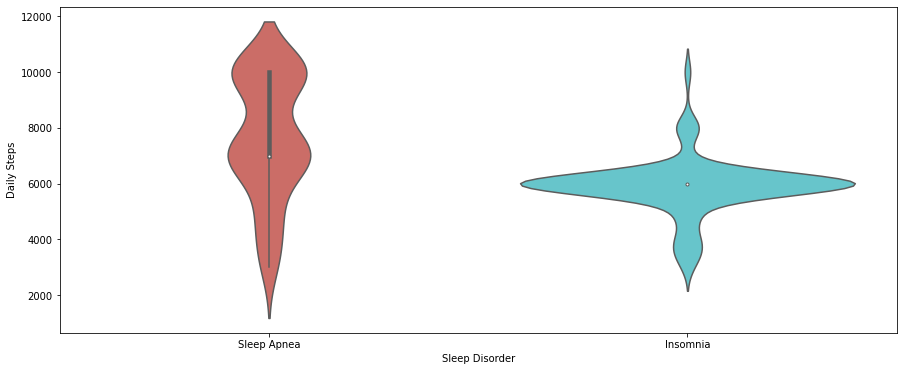

In [78]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID':
            if j != 'Blood Pressure':
                plt.figure(figsize=(15,6))
                sns.violinplot(x = df[j], y = df[i], data = df, palette = 'hls')
                plt.show()

In [79]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID' and j != 'Blood Pressure':
            fig = px.violin(df, x=j, y=i)
            fig.show()

In [80]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID' and j != 'Blood Pressure':
            fig = go.Figure(data=[go.Pie(labels=df[j], values=df[i])])
            fig.show()

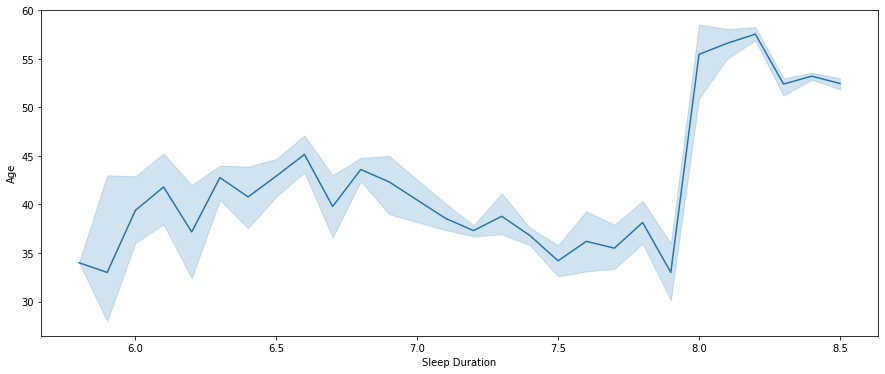

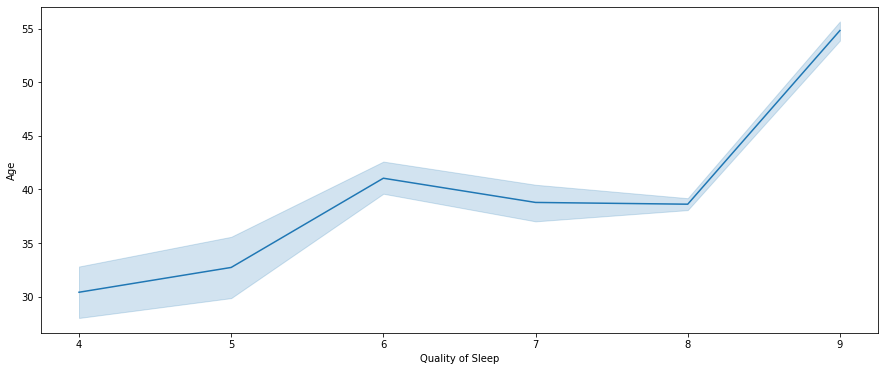

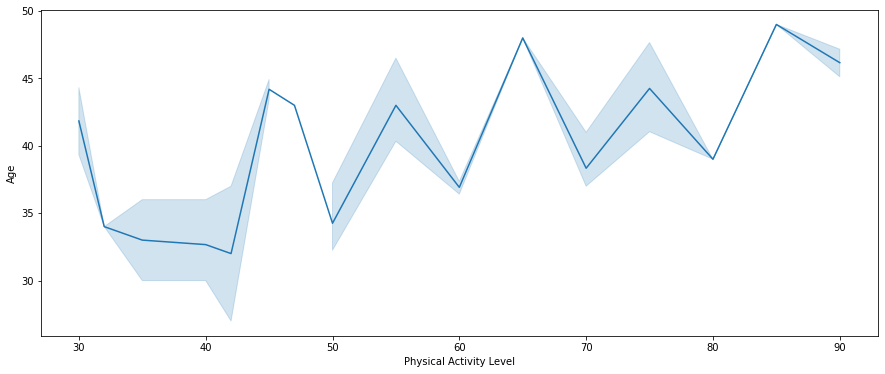

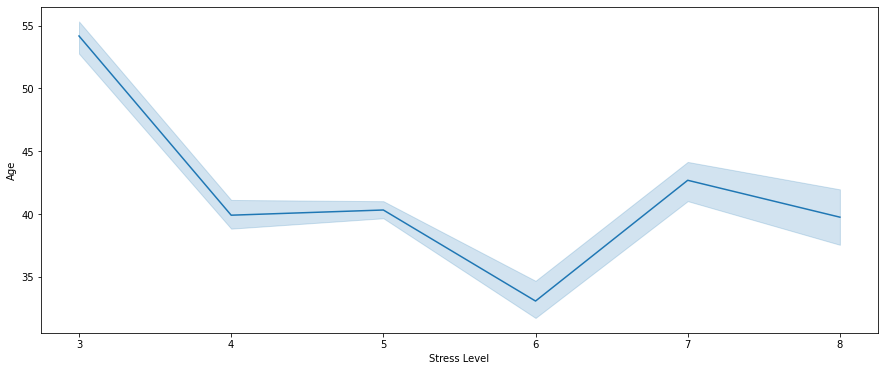

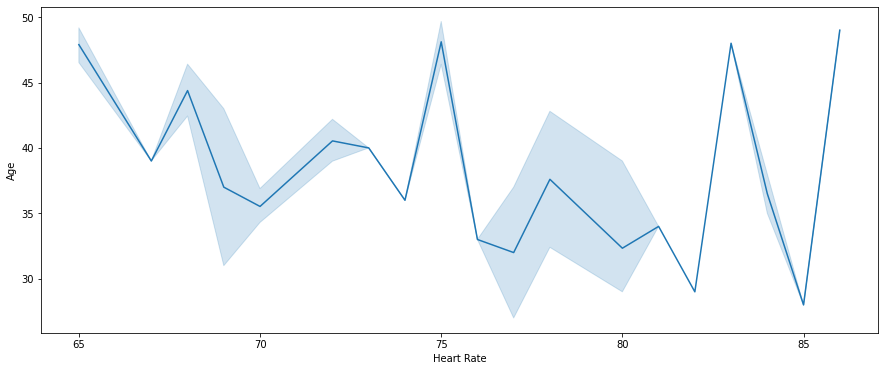

...

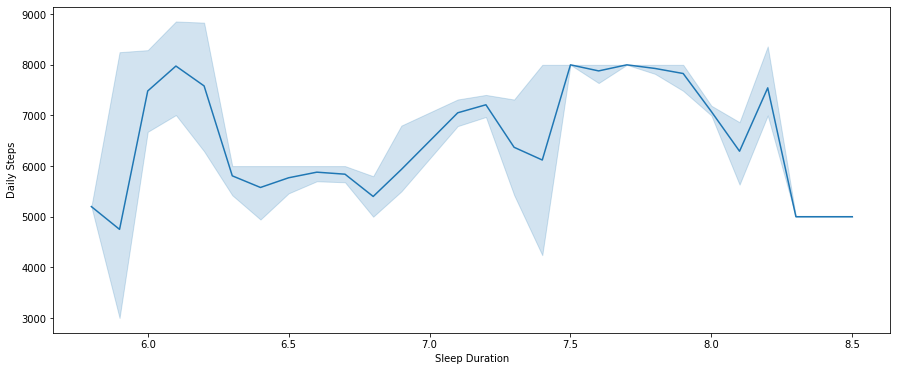

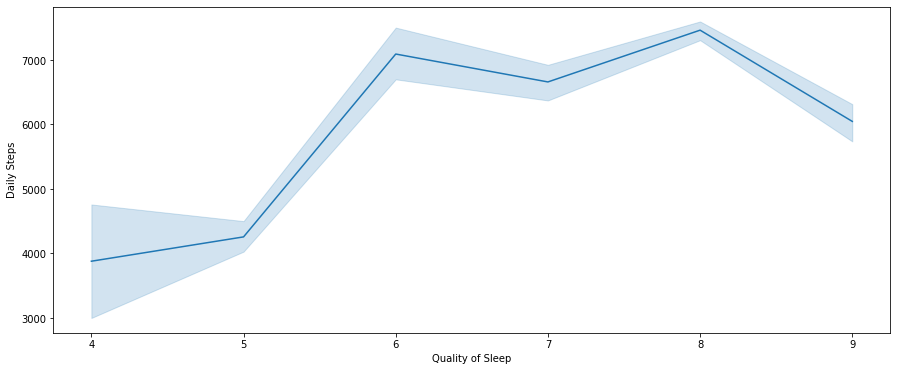

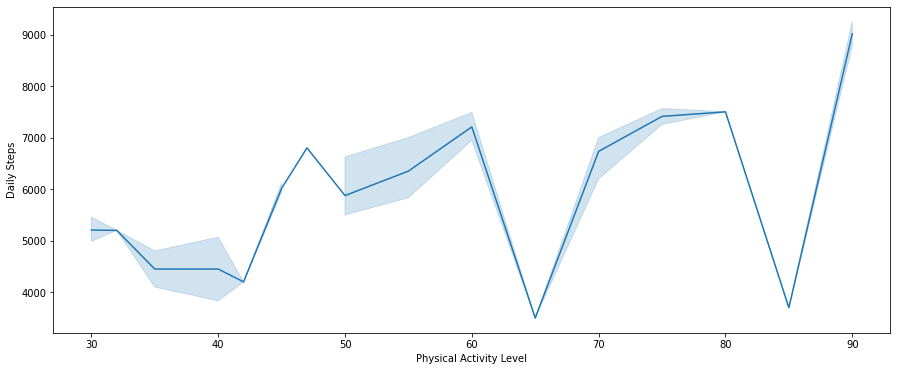

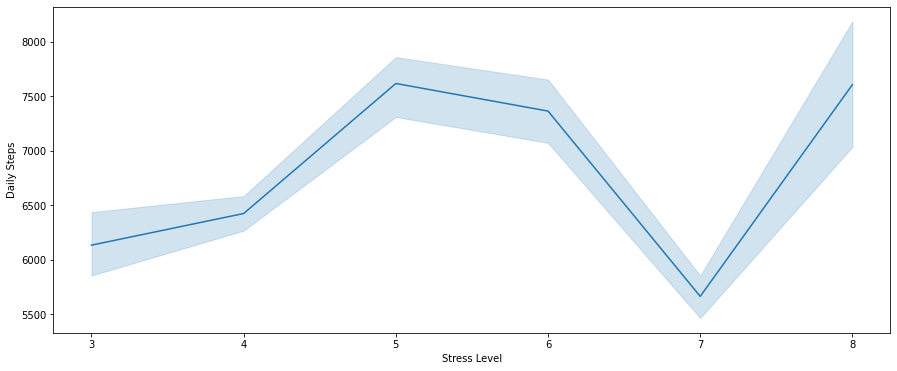

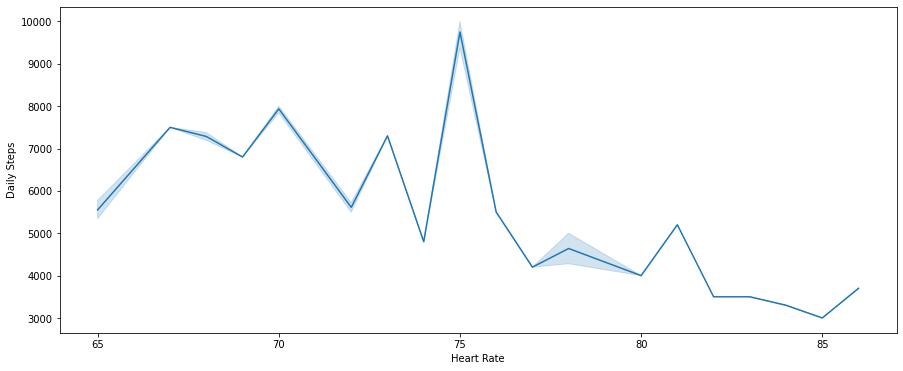

In [81]:
for i in numerical_columns:
    for j in numerical_columns:
        if i != 'Person ID':
            if j != 'Person ID':
                if i != j:
                    plt.figure(figsize=(15,6))
                    sns.lineplot(x = df[j], y = df[i], data = df, palette = 'hls')
                    plt.show()

In [84]:
for i in numerical_columns:
    for j in numerical_columns:
        if i != 'Person ID' and j != 'Person ID' and i != j:
            fig = go.Figure(data=go.Scatter(x=df[j], y=df[i], mode='lines'))
            fig.show()

In [85]:
df.columns

Index(['Person ID', 'Gender', 'Age', 'Occupation', 'Sleep Duration',
       'Quality of Sleep', 'Physical Activity Level', 'Stress Level',
       'BMI Category', 'Blood Pressure', 'Heart Rate', 'Daily Steps',
       'Sleep Disorder', 'Systolic', 'Diastolic'],
      dtype='object')

In [86]:
average_systolic = df['Systolic'].mean()
average_diastolic = df['Diastolic'].mean()

print(f"Average Systolic Pressure: {average_systolic}")
print(f"Average Diastolic Pressure: {average_diastolic}")

Average Systolic Pressure: 128.55347593582889
Average Diastolic Pressure: 84.64973262032086


In [87]:
# Create a copy of the DataFrame with only the selected columns
df_selected = df.copy()

In [88]:
df_selected = df_selected.drop(['Person ID', 'Blood Pressure'], axis = 1)

In [89]:
# Encode categorical features using one-hot encoding
df_encoded = pd.get_dummies(df_selected, columns=['Gender', 'Occupation', 'BMI Category'])

In [117]:
# Calculate the correlation matrix
correlation_matrix = df_encoded.corr()

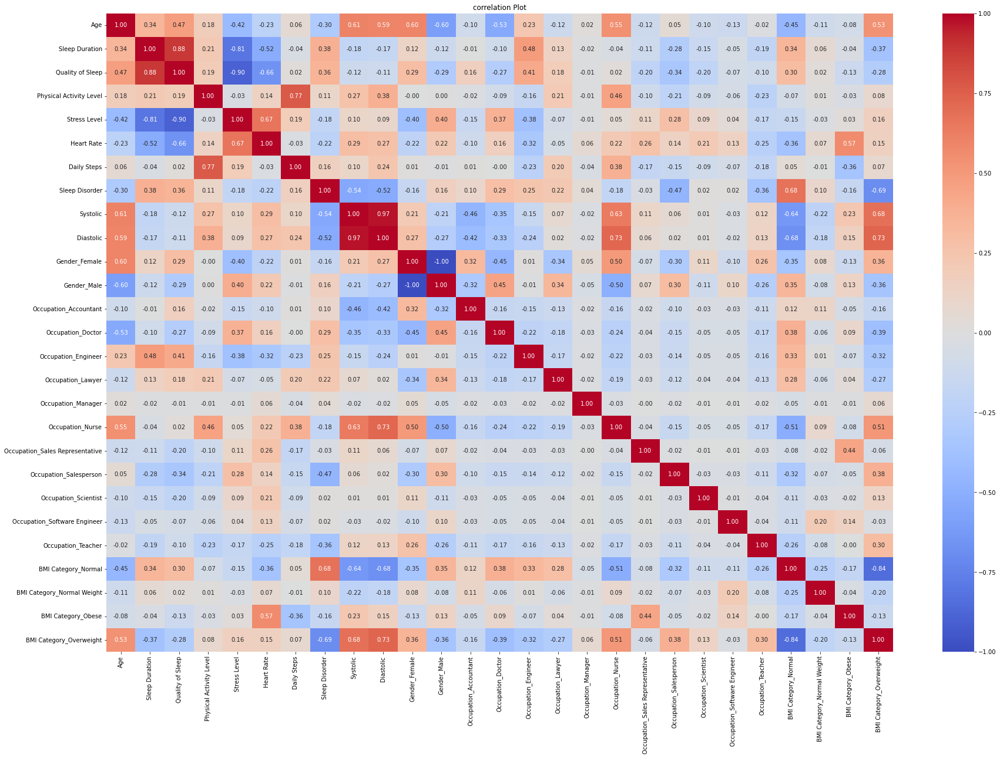

In [118]:
plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('correlation Plot')
plt.show()

In [97]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_encoded['Sleep Disorder'] = label_encoder.fit_transform(df_encoded['Sleep Disorder'])

In [98]:
from sklearn.ensemble import RandomForestClassifier

# Assuming X is the feature matrix and y is the target variable
X = df_encoded.drop('Sleep Disorder', axis=1)  # Drop the target variable from the feature matrix
y = df_encoded['Sleep Disorder']

# Create a random forest classifier
clf = RandomForestClassifier()

# Fit the classifier to the data
clf.fit(X, y)

# Get feature importance scores
feature_importance = clf.feature_importances_

# Create a DataFrame to display feature importance scores
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print the feature importance scores
print(feature_importance_df)

                            Feature  Importance
7                          Systolic    0.128998
8                         Diastolic    0.127443
22              BMI Category_Normal    0.110990
25          BMI Category_Overweight    0.109349
1                    Sleep Duration    0.104218
0                               Age    0.090746
16                 Occupation_Nurse    0.055782
3           Physical Activity Level    0.049700
6                       Daily Steps    0.049133
5                        Heart Rate    0.044560
4                      Stress Level    0.026609
2                  Quality of Sleep    0.026364
18           Occupation_Salesperson    0.018011
21               Occupation_Teacher    0.015329
12                Occupation_Doctor    0.006556
13              Occupation_Engineer    0.005880
24               BMI Category_Obese    0.005238
9                     Gender_Female    0.004895
23       BMI Category_Normal Weight    0.003880
10                      Gender_Male    0

In [99]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

In [100]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [101]:
logreg = LogisticRegression()

In [102]:
logreg.fit(X_train, y_train)

LogisticRegression()

In [103]:
y_pred = logreg.predict(X_test)

In [104]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7866666666666666


In [105]:
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.47      0.58        15
           1       0.91      0.62      0.74        16
           2       0.76      0.95      0.85        44

    accuracy                           0.79        75
   macro avg       0.82      0.68      0.72        75
weighted avg       0.80      0.79      0.77        75



In [108]:
from sklearn.tree import DecisionTreeClassifier

In [107]:
dt = DecisionTreeClassifier()

In [109]:
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [110]:
y_pred = dt.predict(X_test)

In [111]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9333333333333333


In [112]:
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90        15
           1       0.88      0.88      0.88        16
           2       0.98      0.95      0.97        44

    accuracy                           0.93        75
   macro avg       0.91      0.92      0.91        75
weighted avg       0.93      0.93      0.93        75



In [128]:
!pip install xgboost


You should consider upgrading via the 'C:\Users\ARCHANA\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [129]:
import xgboost as xgb 

In [130]:
xgb_model = xgb.XGBClassifier()

In [134]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [135]:
y_pred = xgb_model.predict(X_test)

In [136]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9333333333333333


In [137]:
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90        15
           1       0.88      0.88      0.88        16
           2       0.98      0.95      0.97        44

    accuracy                           0.93        75
   macro avg       0.91      0.92      0.91        75
weighted avg       0.93      0.93      0.93        75

